In [ ]:
pip install --upgrade opencv-python

In [ ]:
!pip install pyyaml==5.1
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

In [ ]:
model_path = '/content/drive/MyDrive/Wind_Blade_Detection Model/Copy of model_final.pth'
from natsort import natsorted
# model_path = '/content/drive/MyDrive/model_final.pth'
from sklearn.cluster import AgglomerativeClustering
import imutils
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import os, json, cv2, random
import torch
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import ColorMode

from skimage.filters import threshold_otsu
from skimage import measure #import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb
from skimage.color import rgb2gray
from skimage.segmentation import clear_border

MIN_MATCH_COUNT = 10

cfg = get_cfg()
cfg.MODEL.DEVICE='cpu'
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATALOADER.NUM_WORKERS = 2
# cfg.OUTPUT_DIR = '.'
cfg.MODEL.WEIGHTS = os.path.join(model_path)

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only one class

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom tesleting threshold
predictor = DefaultPredictor(cfg)

The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std


In [ ]:
import os
import cv2
import glob
import numpy as np
from natsort import natsorted
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
def get_mask(img):
  # print(img.shape)
  op = predictor(img)
  # print(op)
  # img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  mask = op['instances'].pred_masks.detach().numpy()[0].astype('uint8')
  # print(mask.shape)
  mask = np.array([mask,mask,mask]).transpose((1,2,0))
  masked_image = np.where(mask==1,img,0)
  # mask = np.where(mask,255,0).astype('uint8')
  return masked_image,mask

In [ ]:
def get_points(im,mask_by=None):
  if im is None:
    return False,None,None
  # mask = get_mask(im)
  mask = im
  if mask_by is not None:
    h,w = mask_by.shape[:2]
    mask[h:,w:]=0
  y_l,x_l,_ = np.where(mask>0)
  indices = np.random.randint(0,len(x_l),2000)
  g0 = []
  for ind in indices:
    # print(x_l[ind],y_l[ind])
    g0.append([[x_l[ind],y_l[ind]]])

  g0=np.array(g0,dtype=np.float32)

  fr=mask.copy()

  draw = np.int0(g0)
  for j in draw:
    x,y = j.ravel()
    cv2.circle(fr,(x,y),5,(0,255,0),-1)

  return True,fr,g0,mask

In [ ]:
colors_list = np.random.randint(0,255,(1000000,3)).tolist()

In [ ]:
K = np.array([[3666.666504, 0., 2432.000000],
              [0., 3666.666504, 1824.000000],
              [0., 0., 1.]])

In [ ]:
# K = np.array([[3196.06 , 0., 1974.31],
#               [0., 3159.86, 1405.73],
#               [0., 0., 1.]])

In [ ]:
files = natsorted(glob.glob('/content/drive/MyDrive/Wind_Video_frames/*'))
len(files)

242

In [ ]:
def getPointsHomography(getpoints,H,inv):
  gp = getpoints.reshape(-1,2)
  l = np.ones((len(getpoints),1))
  gp = np.hstack((gp,l))
  if inv is True:
    H = np.linalg.inv(H)
  # print(gp.T.shape)
  new = H @ gp.T
  # print(new.shape)
  new = cv2.convertPointsFromHomogeneous(new.T)
  # new /= new[2]
  # new = new[:2]
  return new

In [ ]:
sift = cv2.SIFT_create()
bfmatcher = cv2.BFMatcher_create(crossCheck=True)

In [ ]:
d = np.zeros((5,1))

In [ ]:
def drawPoints(img1,p1,img2,p2):
  im1 = img1.copy()
  im2 = img2.copy()

  h1,w1 = im1.shape[:2]
  h2,w2 = im2.shape[:2]

  im1_gray = cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
  im2_gray = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

  draw0 = np.int0(p1)
  outside1 = 0
  outside_mask1 = 0
  for j0,d0 in enumerate(draw0):
    a,b = d0.ravel()
    # if im1_gray[b,a] == 0:
    #   outside_mask1+=1
    # if a > w1 or b > h1:
    #   outside1+=1
    im1 = cv2.circle(im1,(a,b),10,colors_list[j0],-1)

  print('Number of points predicted ouside the image 1 = ',outside1)
  print('Number of points predicted ouside the image 1 mask = ',outside_mask1)

  draw1 = np.int0(p2)
  outside2 = 0
  outside_mask2 = 0
  for j1,d1 in enumerate(draw1):
    a,b = d1.ravel()
    # if im2_gray[b,a] == 0:
    #   outside_mask2+=1
    # if a > w2 or b > h2:
    #   outside2+=1
    im2 = cv2.circle(im2,(a,b),10,colors_list[j1],-1)

  print('Number of points predicted ouside the image 2 = ',outside2)
  print('Number of points predicted ouside the image 2 mask = ',outside_mask2)

  im1 = cv2.cvtColor(im1,cv2.COLOR_BGR2RGB)
  im2 = cv2.cvtColor(im2,cv2.COLOR_BGR2RGB)

  fig = plt.figure(figsize=(15,10))
  fig.add_subplot(1,2,1)
  plt.imshow(im1)

  fig.add_subplot(1,2,2)
  plt.imshow(im2)

  plt.show()
  return True


In [ ]:
def getNewPoints(img1,img2):
  kp1, des1 = sift.detectAndCompute(img1, None) 
  kp2, des2 = sift.detectAndCompute(img2, None) 
  print(f'Number of SIFT Keypoints : kp1 : {len(kp1)}  kp2 : {len(kp2)}')

  matches = bfmatcher.match(des1,des2)
  print('Number of matches = ',len(matches))

  p1 = np.array([kp1[m.queryIdx].pt for m in matches]).astype('float32')
  p2 = np.array([kp2[m.trainIdx].pt for m in matches]).astype('float32')

  HomographyMatrix,HomographyMask = cv2.findHomography(p1,p2,cv2.RANSAC,5,0.5)
  HomographyMasklist = HomographyMask.ravel().tolist()

  print('Homography 1 between sift keypoints : ')
  print('HomographyMask.shape : ',HomographyMask.shape,' HomographyMask.sum() : ',HomographyMask.sum())

  # matches_from_homography = tuple([m for mi,m in enumerate(matches) if HomographyMasklist[mi] == 1])
  # print('matches_from_homography = ',len(matches_from_homography))

  p1 = p1[HomographyMask.ravel() == 1].reshape(-1,1,2)
  p2 = p2[HomographyMask.ravel() == 1].reshape(-1,1,2)

  sp1 = p1.copy() #[HM.ravel() == 1].reshape(-1,1,2)
  sp2 = p2.copy() #[HM.ravel() == 1].reshape(-1,1,2)

  print('\nDrawing sift Matches filtered using mask from homography')
  imd = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,matchesMask = HomographyMasklist)
  imd = cv2.cvtColor(imd,cv2.COLOR_BGR2RGB)
  fig = plt.figure(figsize=(30,30))
  plt.imshow(imd)
  plt.show()

  getp1 = get_points(img1)[2]
  cgp1 = np.int0(getp1).reshape(-1,2)
  colors1 = np.array([img1[l[1], l[0]] for l in cgp1])
  
  getp2 = get_points(img2)[2]
  cgp2 = np.int0(getp1).reshape(-1,2)
  colors2 = np.array([img2[l[1], l[0]] for l in cgp2])

  new_p2 = getPointsHomography(getp1,HomographyMatrix,inv = False) 
  new_p1 = getPointsHomography(getp2,HomographyMatrix,inv = True) 
  all_colors = np.vstack((colors1,colors2))


  p1 = np.vstack((getp1,new_p1))
  p2 = np.vstack((new_p2,getp2))

  

  return p1,p2,sp1,sp2,all_colors,HomographyMatrix

In [ ]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms

In [ ]:
def filterPoints(img1,p1,img2,p2):
  h1,w1 = img1.shape[:2]
  h2,w2 = img2.shape[:2]

  im1_gray = cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
  im2_gray = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

  m = []

  draw1 = np.int0(p2)

  for j1,d1 in enumerate(draw1):
    a,b = d1.ravel()
    if a >= w2 or b >= h2 or a < 0 or b < 0:
      m.append(0)
    else:
      m.append(1)
  m = np.array(m)
  p1 = p1[m==1].reshape(-1,1,2)
  p2 = p2[m==1].reshape(-1,1,2)

  m = []

  draw1 = np.int0(p1)

  for j1,d1 in enumerate(draw1):
    a,b = d1.ravel()
    if a >= w1 or b >= h1 or a < 0 or b < 0:
      m.append(0)
    else:
      m.append(1)
  m = np.array(m)
  # print('m.sum : ',sum(m))
  p1 = p1[m==1].reshape(-1,1,2)
  p2 = p2[m==1].reshape(-1,1,2)

  return p1,p2

In [ ]:
im1.shape

(2160, 3840, 3)

In [ ]:
im1[2159,3839]

array([0, 0, 0], dtype=uint8)

In [ ]:
def to_ply(path, point_cloud, colors, densify):
    out_points = point_cloud.reshape(-1, 3) * 200
    out_colors = colors.reshape(-1, 3)
    #print(out_colors.shape, out_points.shape)
    verts = np.hstack([out_points, out_colors])

    # cleaning point cloud
    mean = np.mean(verts[:, :3], axis=0)
    temp = verts[:, :3] - mean
    dist = np.sqrt(temp[:, 0] ** 2 + temp[:, 1] ** 2 + temp[:, 2] ** 2)
    #print(dist.shape, np.mean(dist))
    indx = np.where(dist < np.mean(dist) + 300)
    verts = verts[indx]
    #print( verts.shape)
    ply_header = '''ply
		format ascii 1.0
		element vertex %(vert_num)d
		property float x
		property float y
		property float z
		property uchar blue
		property uchar green
		property uchar red
		end_header
		'''
    if not densify:
        with open(path + '/wind.ply', 'w') as f:
            f.write(ply_header % dict(vert_num=len(verts)))
            np.savetxt(f, verts, '%f %f %f %d %d %d')
    else:
        with open(path + '/iwind.ply', 'w') as f:
            f.write(ply_header % dict(vert_num=len(verts)))
            np.savetxt(f, verts, '%f %f %f %d %d %d')


 10
Number of SIFT Keypoints : kp1 : 777  kp2 : 745
Number of matches =  322
Homography 1 between sift keypoints : 
HomographyMask.shape :  (322, 1)  HomographyMask.sum() :  199

Drawing sift Matches filtered using mask from homography


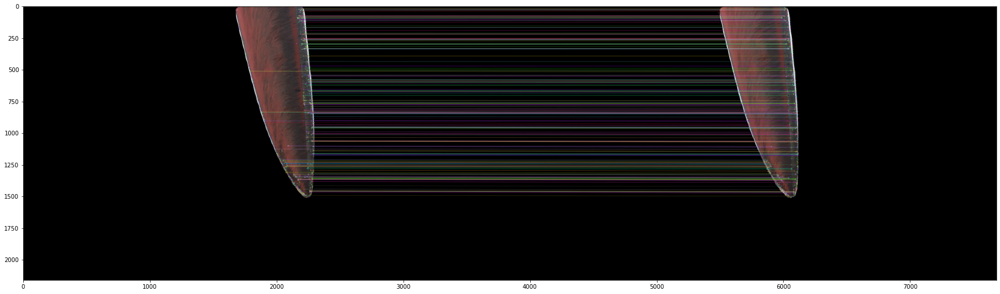

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


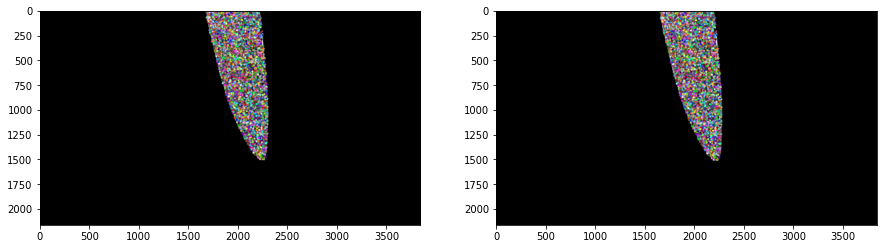

sift key points after essential matrix
matchesMask  199 186
sp1 shape : (186, 1, 2) and sp2 shape : (186, 1, 2)
Projection Matrix
[[ 3.68378143e+03 -9.31793746e+00  2.40597897e+03 -1.57148662e+03]
 [ 2.09286483e+01  3.66567114e+03  1.82587960e+03 -3.51337409e+02]
 [ 7.07876568e-03 -5.40621060e-04  9.99974799e-01 -9.15761919e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


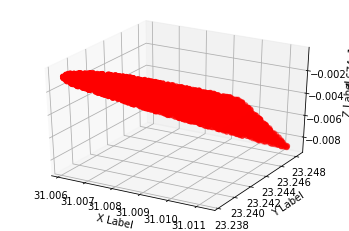

3d image1


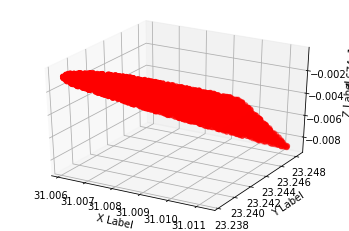


 20
Number of SIFT Keypoints : kp1 : 745  kp2 : 692
Number of matches =  307
Homography 1 between sift keypoints : 
HomographyMask.shape :  (307, 1)  HomographyMask.sum() :  163

Drawing sift Matches filtered using mask from homography


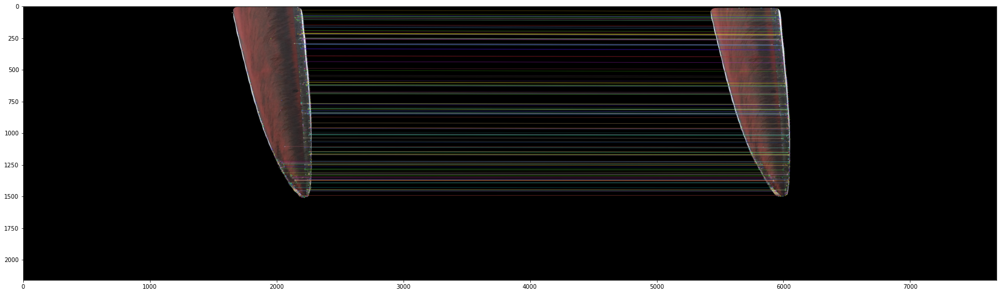

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


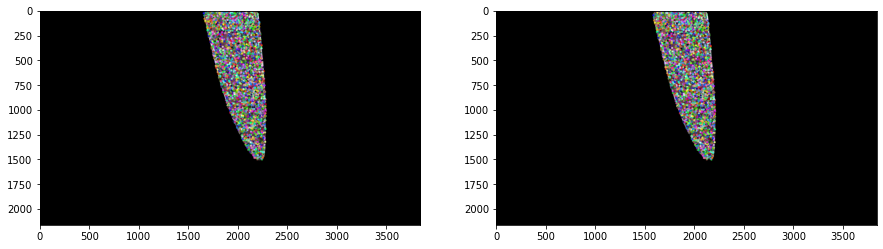

sift key points after essential matrix
matchesMask  163 157
sp1 shape : (157, 1, 2) and sp2 shape : (157, 1, 2)
Projection Matrix
[[ 3.67115280e+03  2.20972356e+01  2.42512188e+03 -2.05267039e+03]
 [-4.87812249e+00  3.67700875e+03  1.80305355e+03  1.84420629e+03]
 [ 1.85109586e-03  5.70788485e-03  9.99981997e-01  4.40215372e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


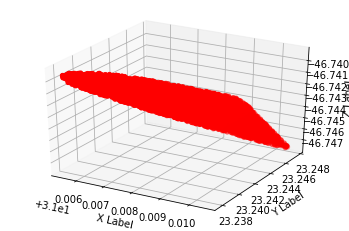

3d image1


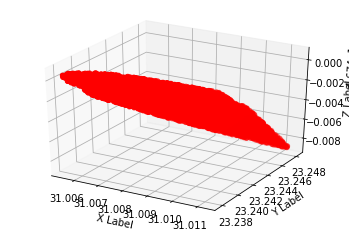


 30
Number of SIFT Keypoints : kp1 : 692  kp2 : 748
Number of matches =  315
Homography 1 between sift keypoints : 
HomographyMask.shape :  (315, 1)  HomographyMask.sum() :  165

Drawing sift Matches filtered using mask from homography


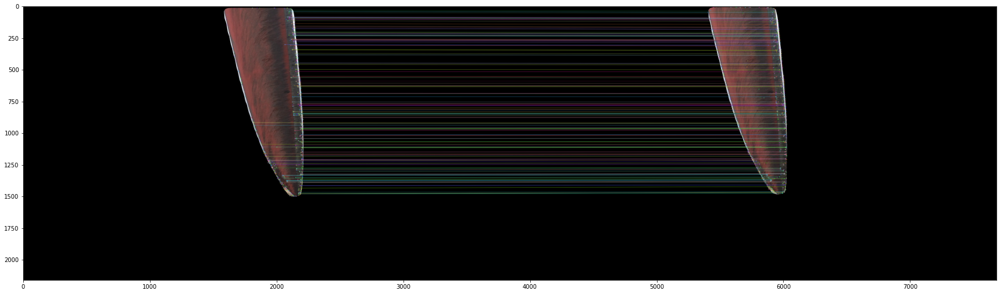

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


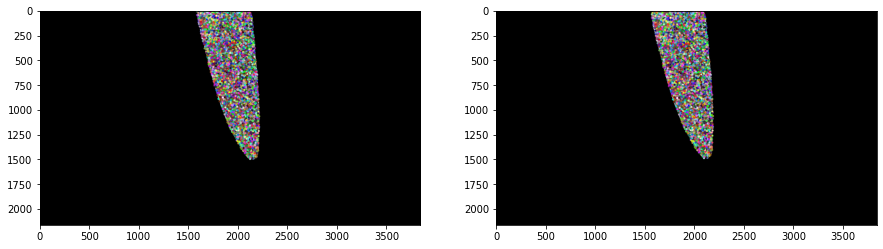

sift key points after essential matrix
matchesMask  165 156
sp1 shape : (156, 1, 2) and sp2 shape : (156, 1, 2)
Projection Matrix
[[-4.29939353e+03 -8.26915233e+02  4.36455908e+02  1.51670082e+03]
 [-2.97759047e+02 -4.05858411e+03 -4.58970397e+02  7.25706599e+02]
 [-3.90033415e-01 -5.07676380e-01  7.68204809e-01  9.39851566e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


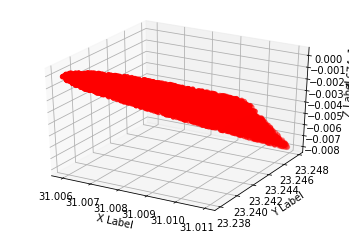

3d image1


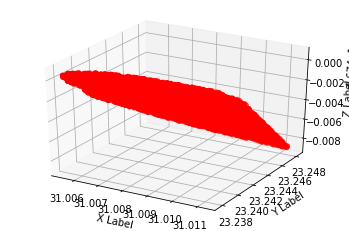


 40
Number of SIFT Keypoints : kp1 : 748  kp2 : 750
Number of matches =  284
Homography 1 between sift keypoints : 
HomographyMask.shape :  (284, 1)  HomographyMask.sum() :  133

Drawing sift Matches filtered using mask from homography


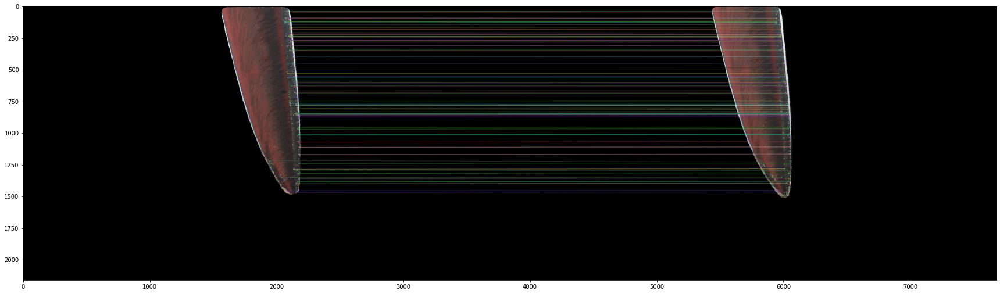

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


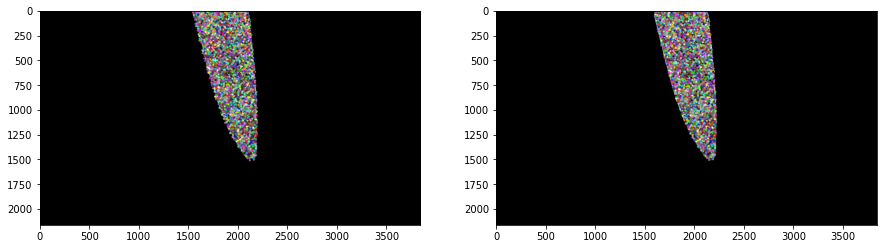

sift key points after essential matrix
matchesMask  133 129
sp1 shape : (129, 1, 2) and sp2 shape : (129, 1, 2)
Projection Matrix
[[ 1.30138348e+03 -3.68152712e+03 -2.02776388e+03 -3.10307098e+03]
 [-3.29537878e+03 -1.20736392e+03 -2.11049054e+03  2.05631721e+03]
 [ 1.09131985e-01 -7.61216110e-02 -9.91108324e-01 -6.83775758e-02]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


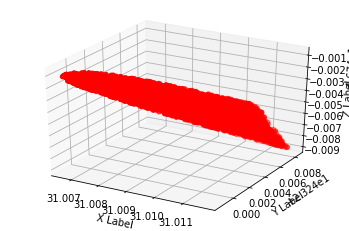

3d image1


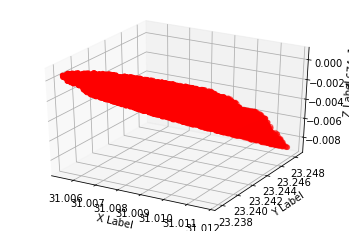


 50
Number of SIFT Keypoints : kp1 : 750  kp2 : 693
Number of matches =  269
Homography 1 between sift keypoints : 
HomographyMask.shape :  (269, 1)  HomographyMask.sum() :  143

Drawing sift Matches filtered using mask from homography


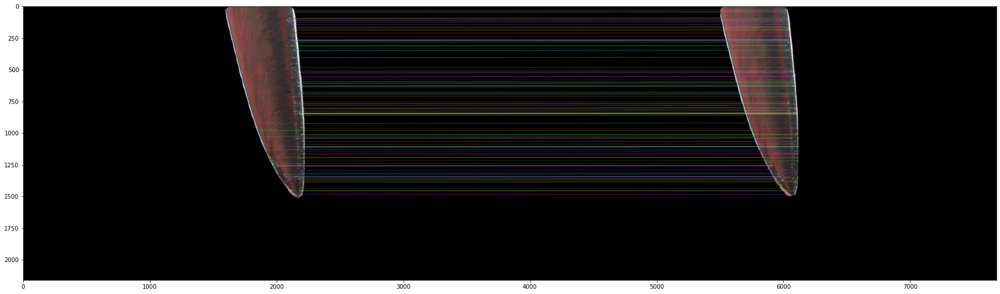

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


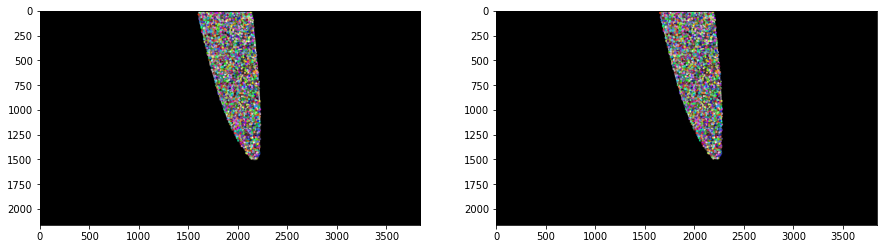

sift key points after essential matrix
matchesMask  143 136
sp1 shape : (136, 1, 2) and sp2 shape : (136, 1, 2)
Projection Matrix
[[ 3.62896563e+03 -7.47005571e+00  2.48789467e+03  1.12018672e+03]
 [-1.83795579e+01  3.66818868e+03  1.82084411e+03  2.27868945e+02]
 [-1.53199386e-02  8.42010602e-04  9.99882288e-01  8.82844688e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


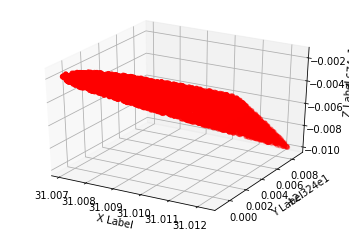

3d image1


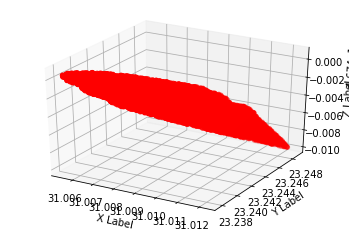


 60
Number of SIFT Keypoints : kp1 : 693  kp2 : 593
Number of matches =  237
Homography 1 between sift keypoints : 
HomographyMask.shape :  (237, 1)  HomographyMask.sum() :  124

Drawing sift Matches filtered using mask from homography


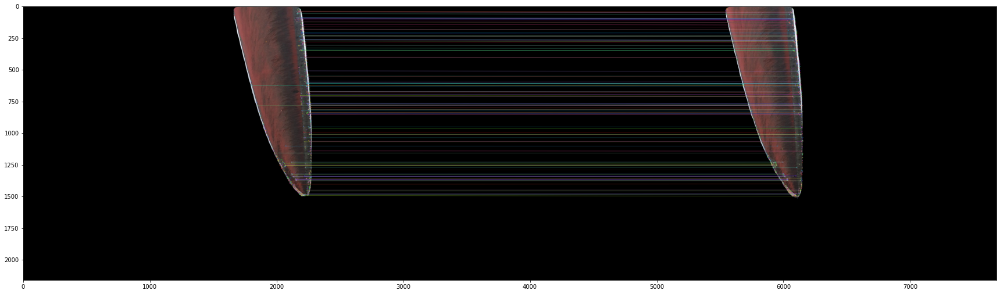

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


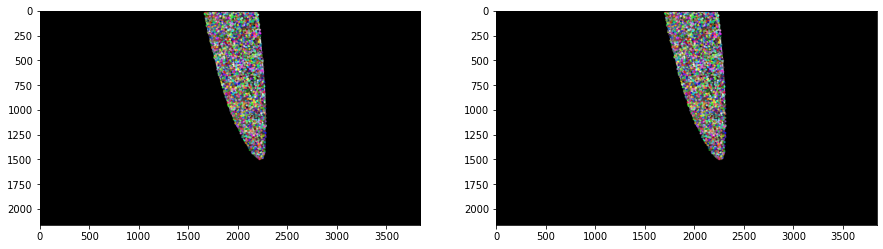

sift key points after essential matrix
matchesMask  124 120
sp1 shape : (120, 1, 2) and sp2 shape : (120, 1, 2)
Projection Matrix
[[-3.78699998e+03 -1.82847421e+03  1.29397855e+03  2.09632807e+03]
 [ 1.72421729e+00 -3.68865948e+03 -1.77910301e+03  2.76977600e+01]
 [-5.20473654e-02 -7.89480824e-01  6.11564470e-01  8.98072141e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


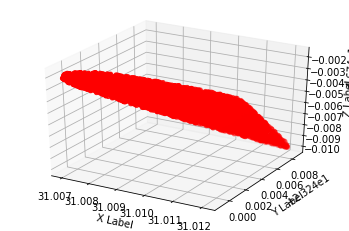

3d image1


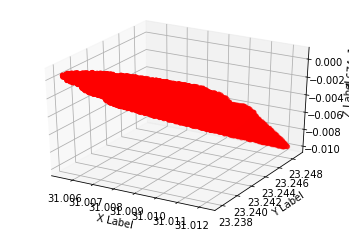


 70
Number of SIFT Keypoints : kp1 : 593  kp2 : 692
Number of matches =  242
Homography 1 between sift keypoints : 
HomographyMask.shape :  (242, 1)  HomographyMask.sum() :  109

Drawing sift Matches filtered using mask from homography


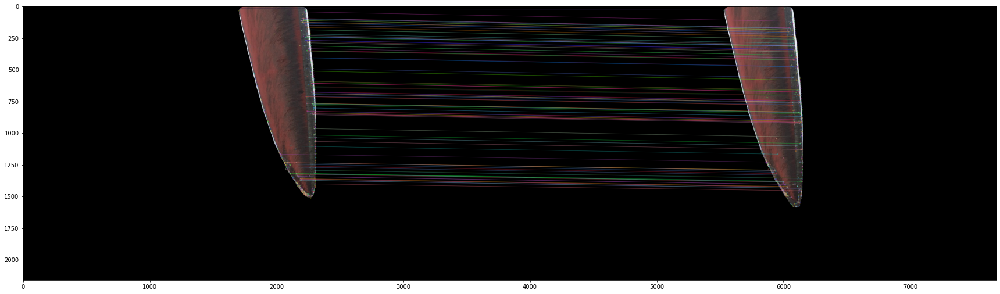

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


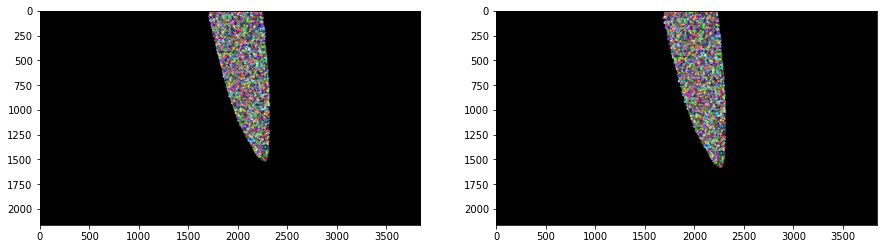

sift key points after essential matrix
matchesMask  109 103
sp1 shape : (103, 1, 2) and sp2 shape : (103, 1, 2)
Projection Matrix
[[ 3.66630536e+03 -3.59983079e+01  2.43227802e+03  2.07097518e+03]
 [-4.63845959e+00  3.63589026e+03  1.88459538e+03  1.36089647e+01]
 [-1.47408332e-04 -1.65947054e-02  9.99862288e-01  8.96415580e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


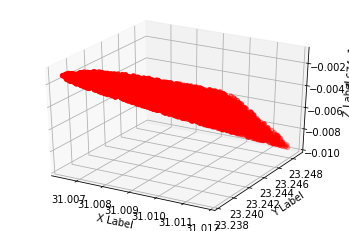

3d image1


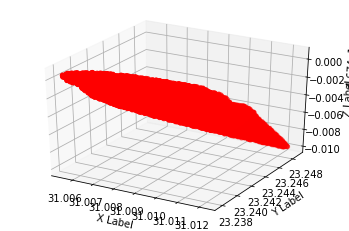


 80
Number of SIFT Keypoints : kp1 : 692  kp2 : 743
Number of matches =  262
Homography 1 between sift keypoints : 
HomographyMask.shape :  (262, 1)  HomographyMask.sum() :  115

Drawing sift Matches filtered using mask from homography


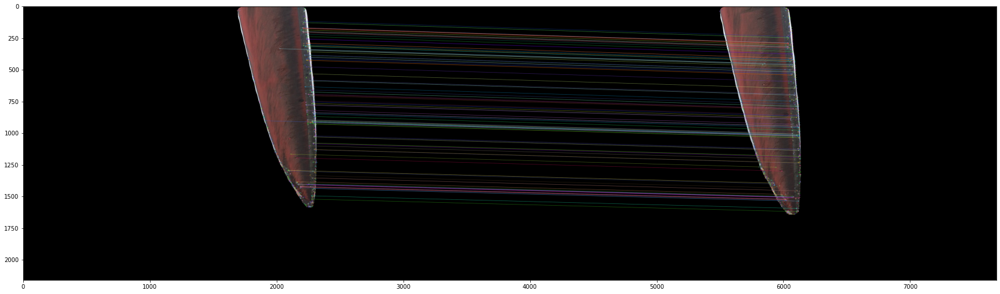

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


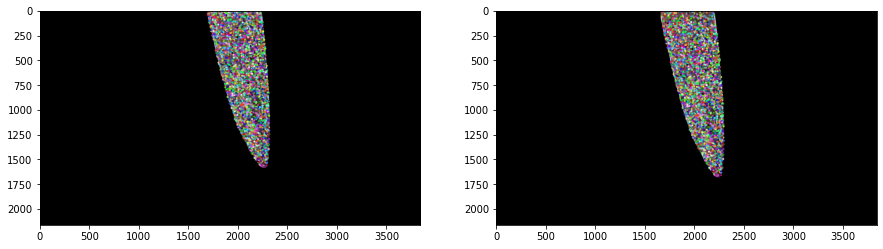

sift key points after essential matrix
matchesMask  115 110
sp1 shape : (110, 1, 2) and sp2 shape : (110, 1, 2)
Projection Matrix
[[ 3.67533349e+03 -5.59551457e+01  2.41823490e+03  2.11916966e+03]
 [-3.28532575e+00  3.61570594e+03  1.92303900e+03  1.44933052e+03]
 [ 3.57878148e-03 -2.71880643e-02  9.99623930e-01  9.91949898e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


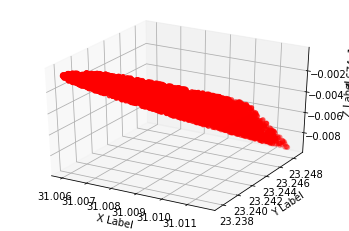

3d image1


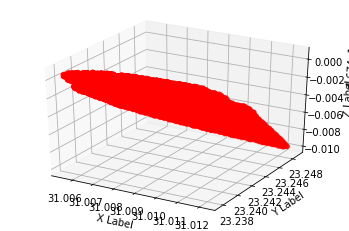


 90
Number of SIFT Keypoints : kp1 : 743  kp2 : 859
Number of matches =  283
Homography 1 between sift keypoints : 
HomographyMask.shape :  (283, 1)  HomographyMask.sum() :  130

Drawing sift Matches filtered using mask from homography


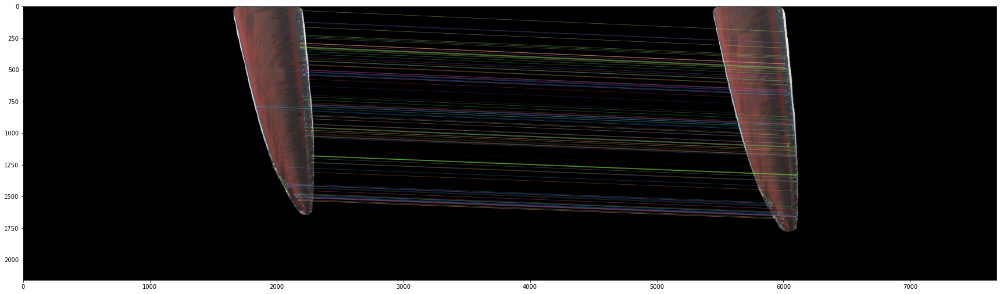

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


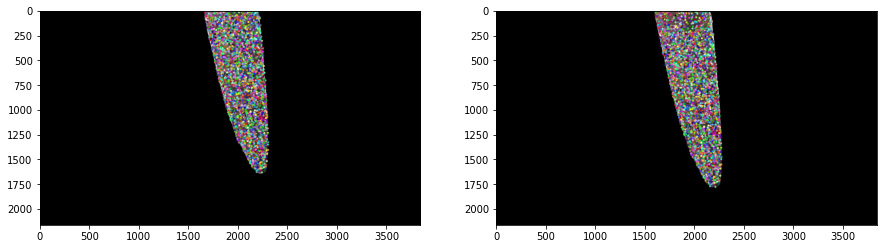

sift key points after essential matrix
matchesMask  130 123
sp1 shape : (123, 1, 2) and sp2 shape : (123, 1, 2)
Projection Matrix
[[ 3.50839618e+03  2.05598567e+01  2.65514610e+03 -2.59133345e+03]
 [-1.18403591e+02  3.67724525e+03  1.79868485e+03  2.27211458e+03]
 [-6.21611853e-02  5.83702573e-03  9.98049055e-01  1.84379212e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


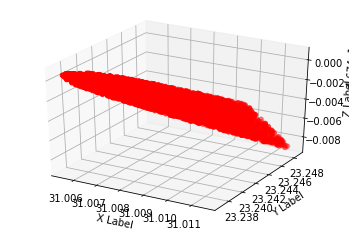

3d image1


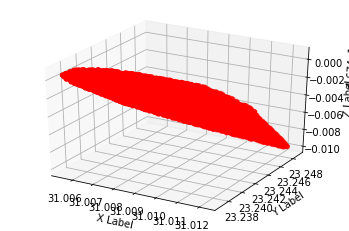


 100
Number of SIFT Keypoints : kp1 : 859  kp2 : 851
Number of matches =  314
Homography 1 between sift keypoints : 
HomographyMask.shape :  (314, 1)  HomographyMask.sum() :  152

Drawing sift Matches filtered using mask from homography


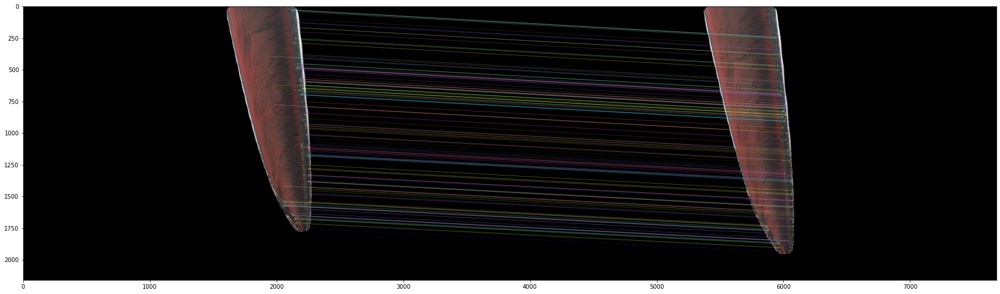

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


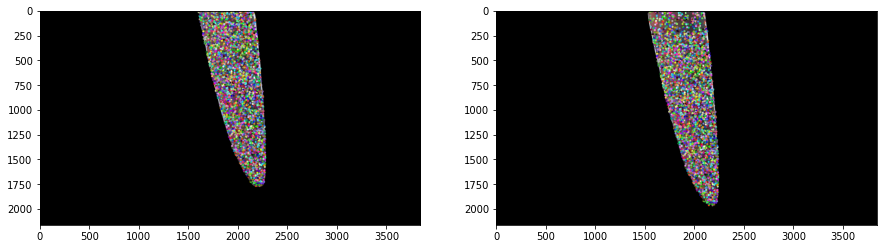

sift key points after essential matrix
matchesMask  152 142
sp1 shape : (142, 1, 2) and sp2 shape : (142, 1, 2)
Projection Matrix
[[ 3.63555072e+03 -9.90345533e+00  2.47825345e+03 -1.15668271e+03]
 [-2.01587536e+01  3.66153834e+03  1.83416190e+03  3.55403733e+03]
 [-1.26727606e-02 -2.80288498e-03  9.99915769e-01  1.06642898e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


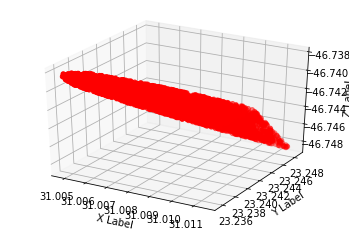

3d image1


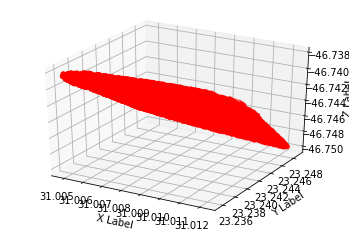


 110
Number of SIFT Keypoints : kp1 : 851  kp2 : 903
Number of matches =  282
Homography 1 between sift keypoints : 
HomographyMask.shape :  (282, 1)  HomographyMask.sum() :  118

Drawing sift Matches filtered using mask from homography


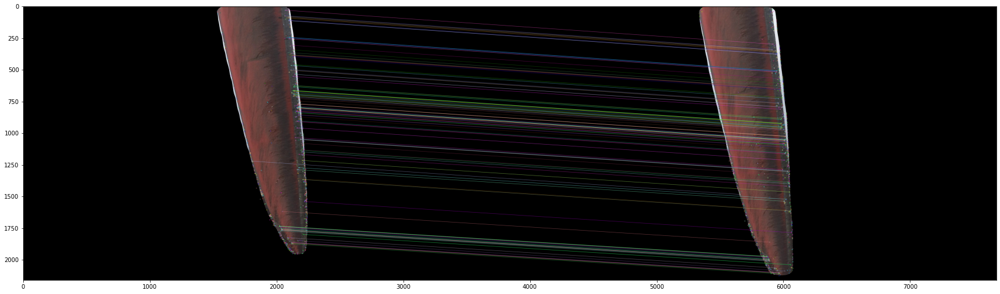

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


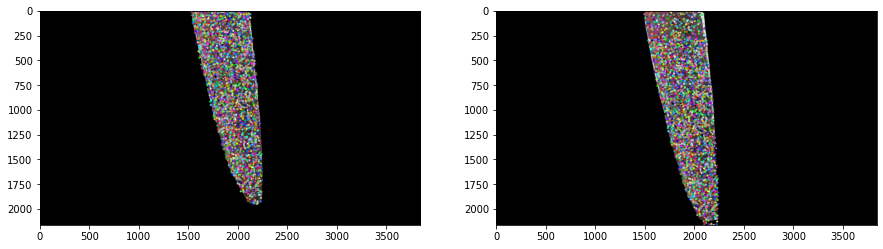

sift key points after essential matrix
matchesMask  118 117
sp1 shape : (117, 1, 2) and sp2 shape : (117, 1, 2)
Projection Matrix
[[ 3.66456801e+03 -1.53190848e+02  2.43033765e+03 -2.24916256e+03]
 [-9.91801803e+00  3.53759540e+03  2.06318677e+03 -1.17178677e+03]
 [-8.58399415e-04 -6.63305845e-02  9.97797332e-01 -9.84607922e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


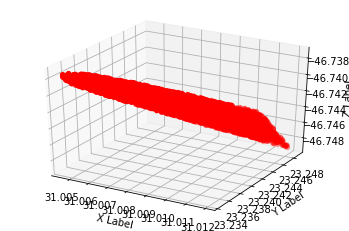

3d image1


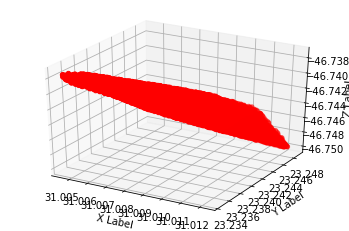


 120
Number of SIFT Keypoints : kp1 : 903  kp2 : 915
Number of matches =  302
Homography 1 between sift keypoints : 
HomographyMask.shape :  (302, 1)  HomographyMask.sum() :  103

Drawing sift Matches filtered using mask from homography


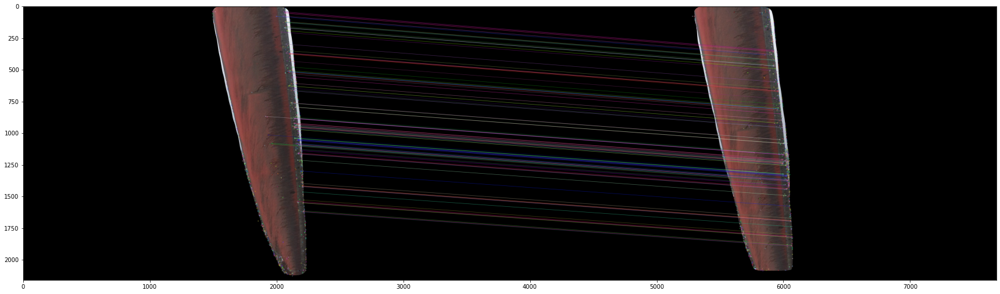

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


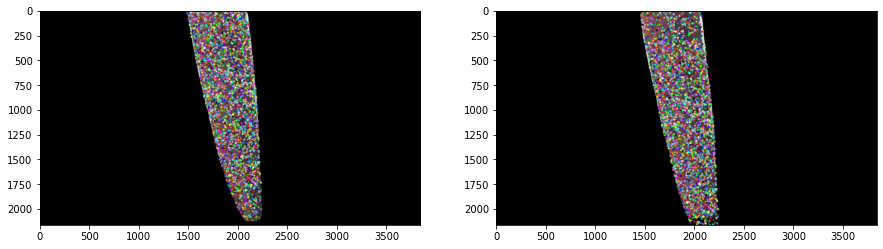

sift key points after essential matrix
matchesMask  103 97
sp1 shape : (97, 1, 2) and sp2 shape : (97, 1, 2)
Projection Matrix
[[ 3.65900610e+03 -1.48485806e+02  2.43899438e+03  1.89853936e+03]
 [-2.88209146e+01  3.52946961e+03  2.07688057e+03  3.51316958e+03]
 [-3.11250079e-03 -7.02183995e-02  9.97526786e-01  8.40796694e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


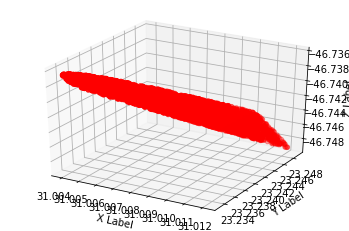

3d image1


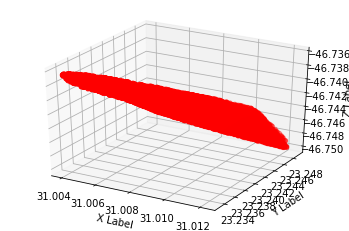


 130
Number of SIFT Keypoints : kp1 : 915  kp2 : 931
Number of matches =  317
Homography 1 between sift keypoints : 
HomographyMask.shape :  (317, 1)  HomographyMask.sum() :  105

Drawing sift Matches filtered using mask from homography


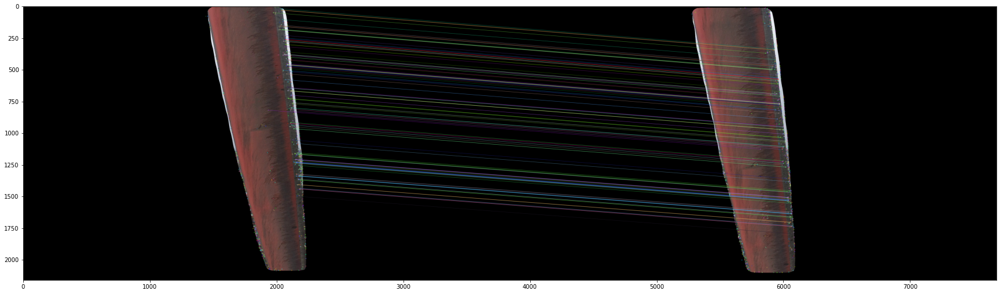

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


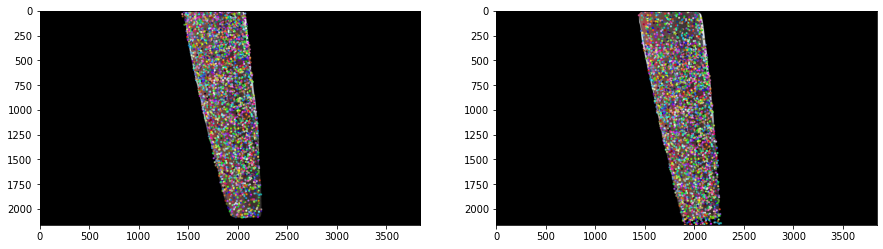

sift key points after essential matrix
matchesMask  105 101
sp1 shape : (101, 1, 2) and sp2 shape : (101, 1, 2)
Projection Matrix
[[ 3.57117704e+03  1.05486555e+01  2.57014602e+03 -4.44812156e+01]
 [-1.83187397e+02  3.58798168e+03  1.96576934e+03  3.45283438e+03]
 [-3.74649664e-02 -4.05886463e-02  9.98473304e-01  6.48962780e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


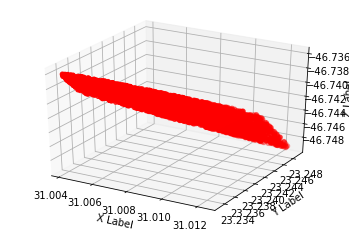

3d image1


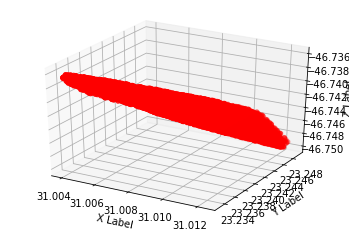


 140
Number of SIFT Keypoints : kp1 : 931  kp2 : 1021
Number of matches =  358
Homography 1 between sift keypoints : 
HomographyMask.shape :  (358, 1)  HomographyMask.sum() :  130

Drawing sift Matches filtered using mask from homography


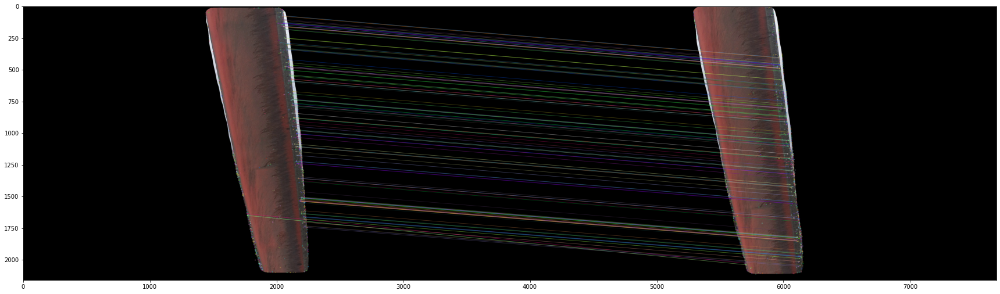

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


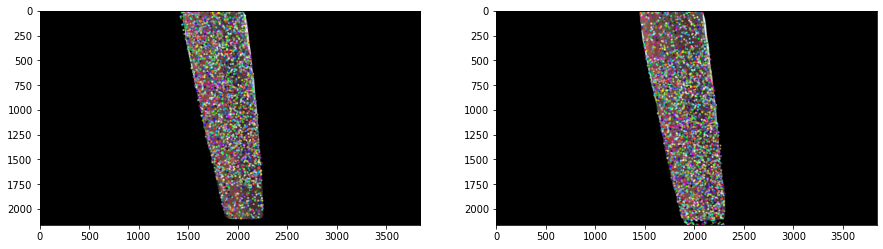

sift key points after essential matrix
matchesMask  130 126
sp1 shape : (126, 1, 2) and sp2 shape : (126, 1, 2)
Projection Matrix
[[ 3.62012483e+03 -1.93911930e+02  2.49322314e+03 -2.29219314e+03]
 [-5.33126818e+01  3.49817754e+03  2.12869231e+03 -1.75821342e+03]
 [-1.88492441e-02 -8.50730226e-02  9.96196410e-01 -9.99140902e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


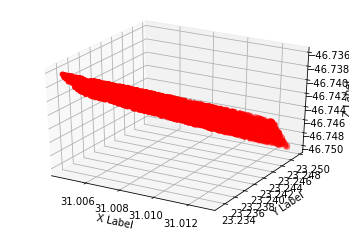

3d image1


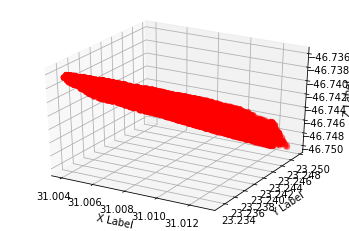


 150
Number of SIFT Keypoints : kp1 : 1021  kp2 : 996
Number of matches =  328
Homography 1 between sift keypoints : 
HomographyMask.shape :  (328, 1)  HomographyMask.sum() :  99

Drawing sift Matches filtered using mask from homography


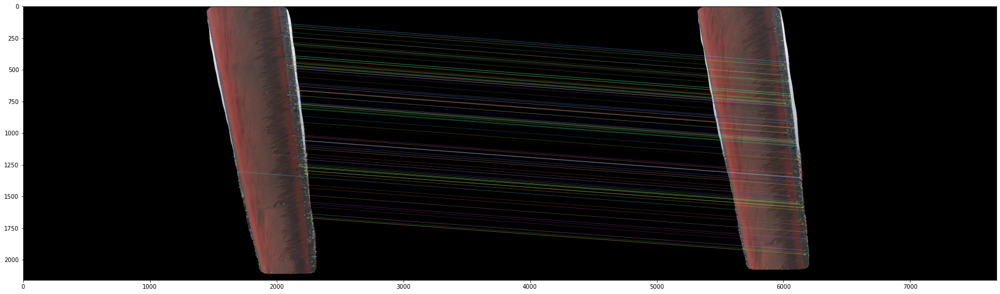

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


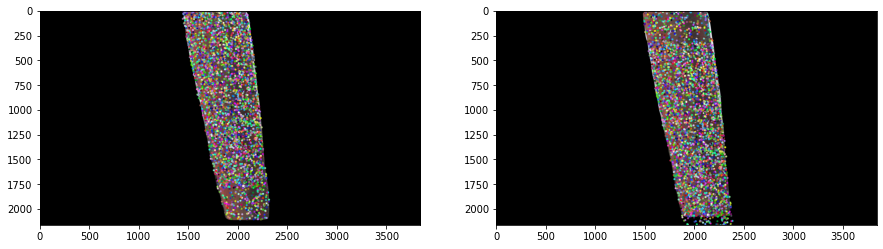

sift key points after essential matrix
matchesMask  99 97
sp1 shape : (97, 1, 2) and sp2 shape : (97, 1, 2)
Projection Matrix
[[ 3.61002044e+03 -1.93919805e+02  2.50783069e+03 -2.33027716e+03]
 [-4.74444857e+01  3.51041636e+03  2.10858845e+03 -1.91749555e+03]
 [-2.28949572e-02 -7.93282296e-02  9.96585597e-01 -9.99293697e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


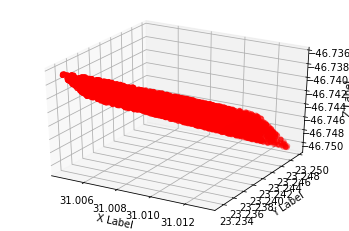

3d image1


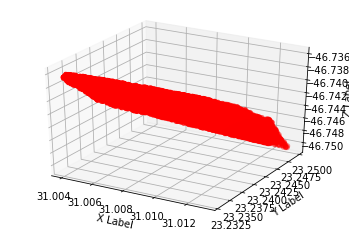


 160
Number of SIFT Keypoints : kp1 : 996  kp2 : 903
Number of matches =  350
Homography 1 between sift keypoints : 
HomographyMask.shape :  (350, 1)  HomographyMask.sum() :  125

Drawing sift Matches filtered using mask from homography


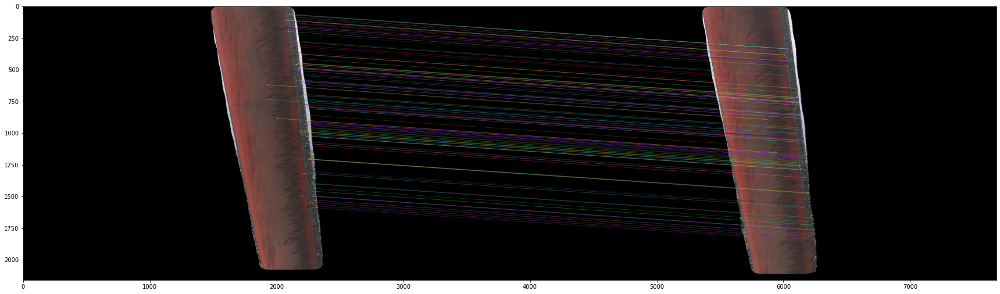

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


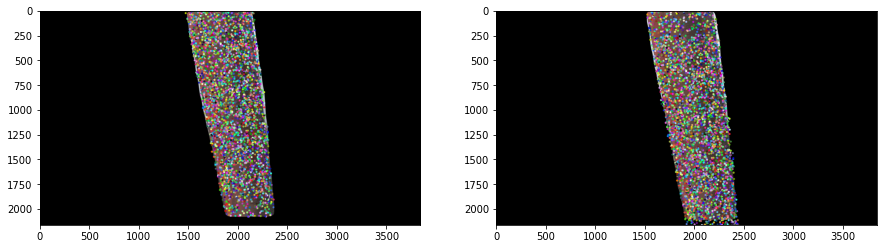

sift key points after essential matrix
matchesMask  125 116
sp1 shape : (116, 1, 2) and sp2 shape : (116, 1, 2)
Projection Matrix
[[ 3.60166298e+03  3.23732502e+01  2.52706212e+03  3.47978525e+02]
 [-4.87300794e+01  3.68907320e+03  1.77757800e+03  3.89576105e+03]
 [-2.62104086e-02  1.24402673e-02  9.99579039e-01  1.47638819e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


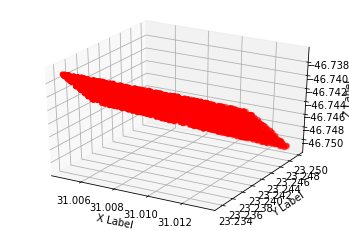

3d image1


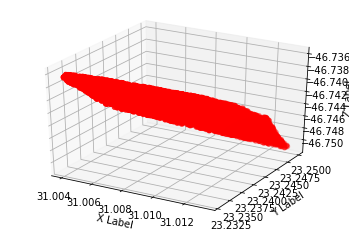


 170
Number of SIFT Keypoints : kp1 : 903  kp2 : 991
Number of matches =  364
Homography 1 between sift keypoints : 
HomographyMask.shape :  (364, 1)  HomographyMask.sum() :  153

Drawing sift Matches filtered using mask from homography


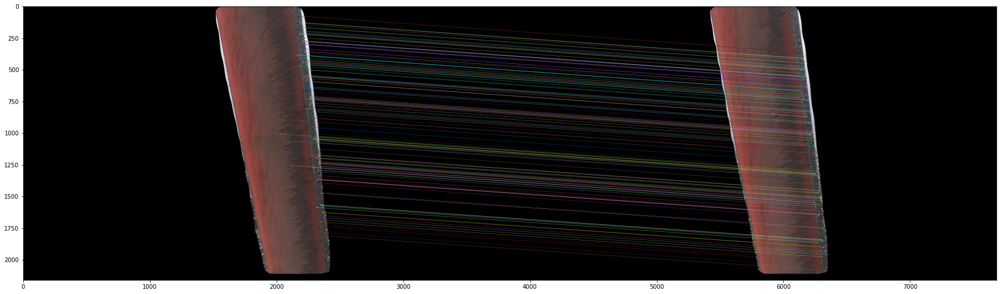

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


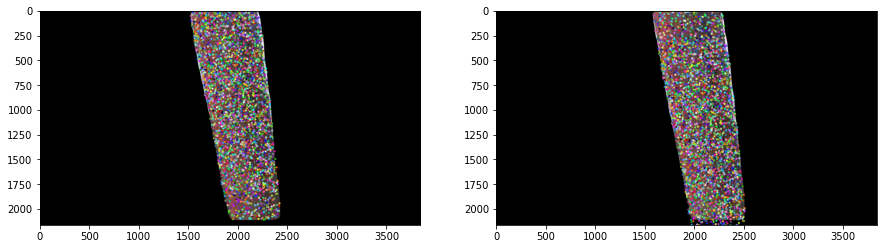

sift key points after essential matrix
matchesMask  153 142
sp1 shape : (142, 1, 2) and sp2 shape : (142, 1, 2)
Projection Matrix
[[ 3.64487758e+03 -2.09095362e+01  2.46444669e+03 -8.35019960e+00]
 [-1.32507317e+02  3.55649149e+03  2.02613656e+03  8.05086009e+01]
 [-8.13276850e-03 -5.62190783e-02  9.98385333e-01 -7.64079786e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


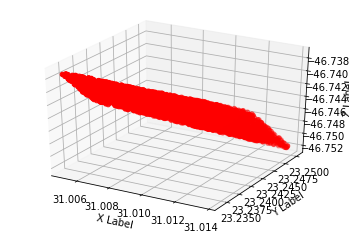

3d image1


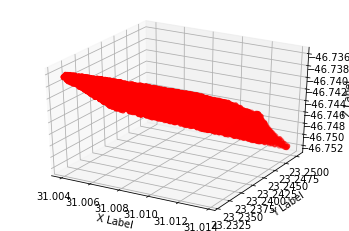


 180
Number of SIFT Keypoints : kp1 : 991  kp2 : 1002
Number of matches =  342
Homography 1 between sift keypoints : 
HomographyMask.shape :  (342, 1)  HomographyMask.sum() :  125

Drawing sift Matches filtered using mask from homography


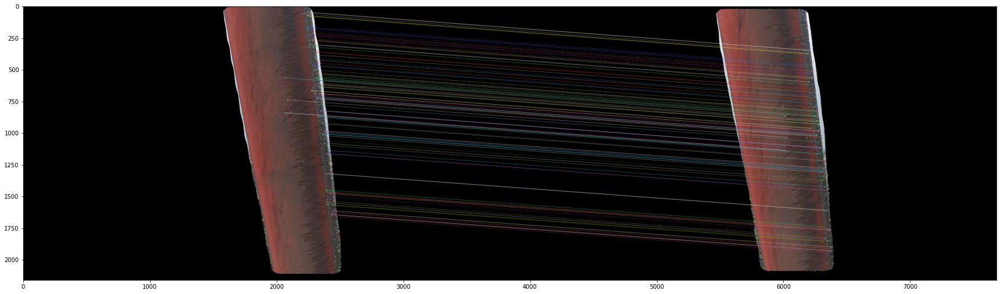

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


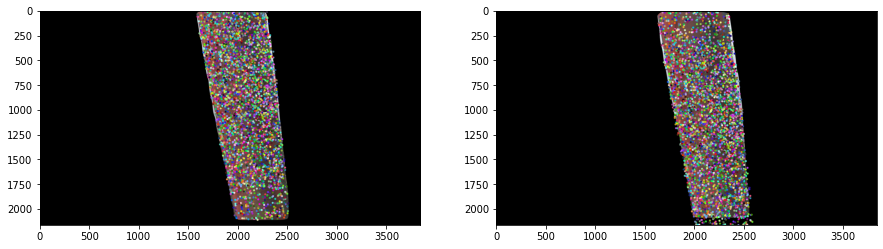

sift key points after essential matrix
matchesMask  125 114
sp1 shape : (114, 1, 2) and sp2 shape : (114, 1, 2)
Projection Matrix
[[ 3.58876449e+03 -1.15789011e+02  2.54291754e+03  1.62268656e+03]
 [-1.30086525e+02  3.52042405e+03  2.08832738e+03  2.43508734e+03]
 [-3.10039078e-02 -7.43038284e-02  9.96753580e-01  9.62947393e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


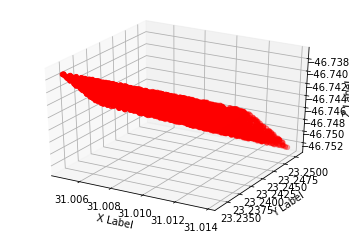

3d image1


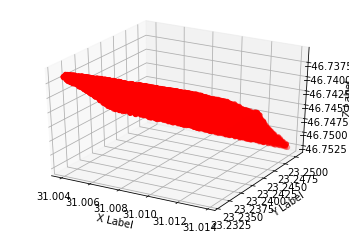


 190
Number of SIFT Keypoints : kp1 : 1002  kp2 : 1084
Number of matches =  392
Homography 1 between sift keypoints : 
HomographyMask.shape :  (392, 1)  HomographyMask.sum() :  137

Drawing sift Matches filtered using mask from homography


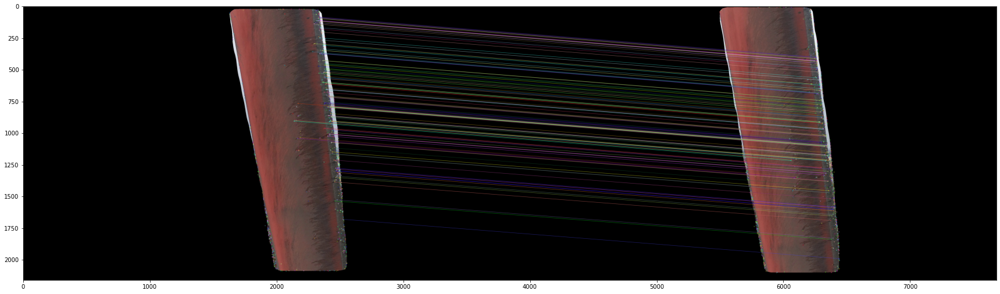

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


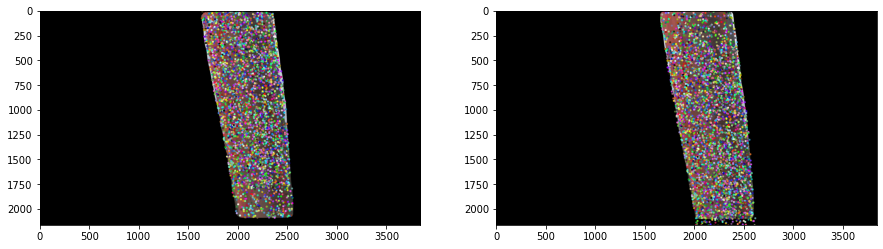

sift key points after essential matrix
matchesMask  137 136
sp1 shape : (136, 1, 2) and sp2 shape : (136, 1, 2)
Projection Matrix
[[ 3.61514095e+03 -2.25515028e+02  2.49779225e+03 -2.62821454e+03]
 [-2.05298313e+01  3.50264260e+03  2.12190777e+03 -1.73548611e+03]
 [-2.08418565e-02 -8.29544109e-02  9.96335377e-01 -9.98232661e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


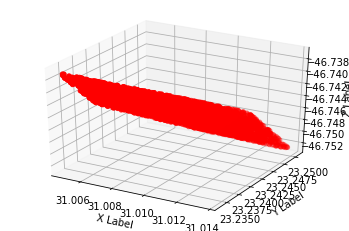

3d image1


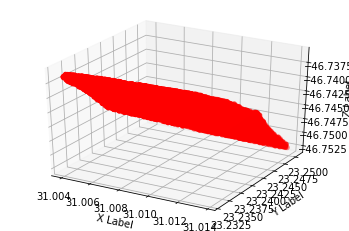


 200
Number of SIFT Keypoints : kp1 : 1084  kp2 : 1395
Number of matches =  426
Homography 1 between sift keypoints : 
HomographyMask.shape :  (426, 1)  HomographyMask.sum() :  140

Drawing sift Matches filtered using mask from homography


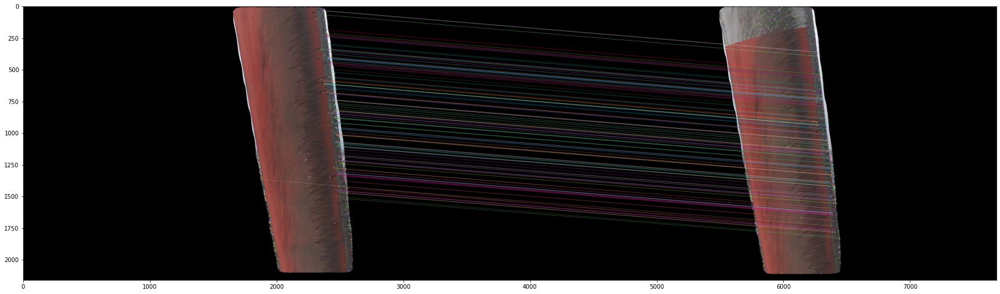

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


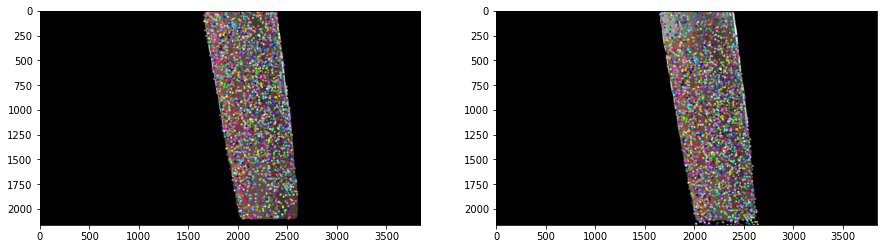

sift key points after essential matrix
matchesMask  140 135
sp1 shape : (135, 1, 2) and sp2 shape : (135, 1, 2)
Projection Matrix
[[3.68864683e+03 2.07405630e+02 2.38954696e+03 9.89970048e+02]
 [1.19929999e+01 3.80776198e+03 1.50738983e+03 3.93669849e+03]
 [9.10160396e-03 8.45540783e-02 9.96377322e-01 2.10687875e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


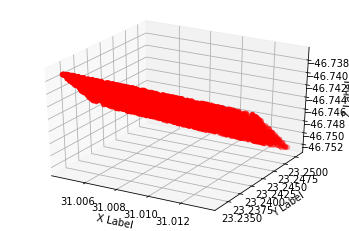

3d image1


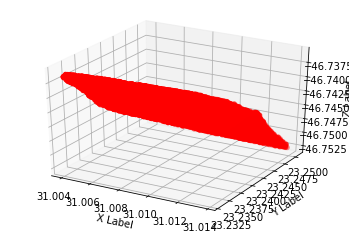


 210
Number of SIFT Keypoints : kp1 : 1395  kp2 : 1970
Number of matches =  591
Homography 1 between sift keypoints : 
HomographyMask.shape :  (591, 1)  HomographyMask.sum() :  225

Drawing sift Matches filtered using mask from homography


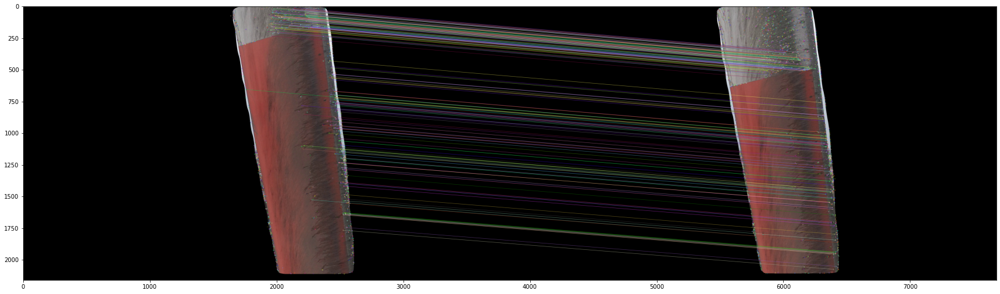

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


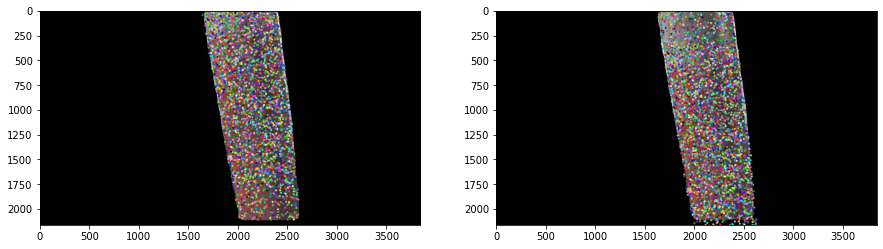

sift key points after essential matrix
matchesMask  225 223
sp1 shape : (223, 1, 2) and sp2 shape : (223, 1, 2)
Projection Matrix
[[ 3.70166104e+03 -5.90102015e+01  2.37766495e+03  1.02320884e+03]
 [ 3.56497896e+01  3.62758054e+03  1.90021257e+03  3.33394477e+03]
 [ 1.45535218e-02 -2.09814231e-02  9.99673934e-01 -6.85899309e-02]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


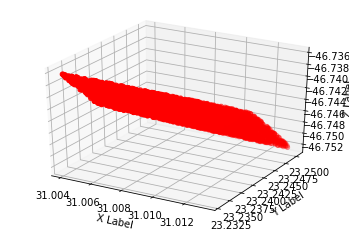

3d image1


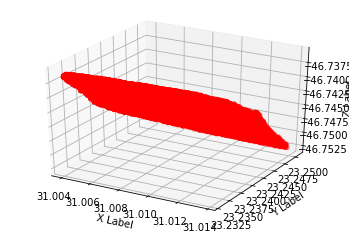


 220
Number of SIFT Keypoints : kp1 : 1970  kp2 : 2871
Number of matches =  884
Homography 1 between sift keypoints : 
HomographyMask.shape :  (884, 1)  HomographyMask.sum() :  397

Drawing sift Matches filtered using mask from homography


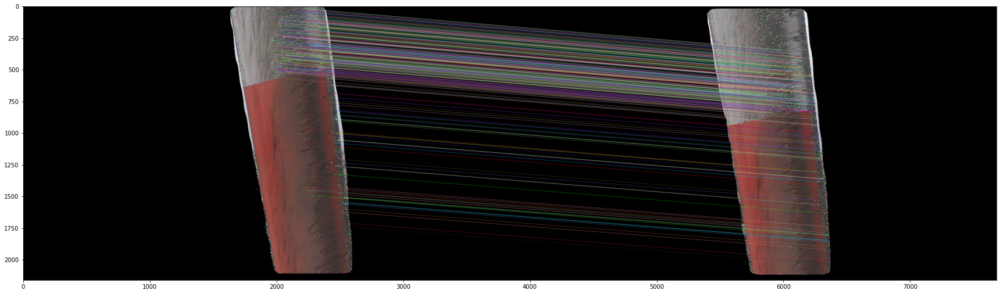

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


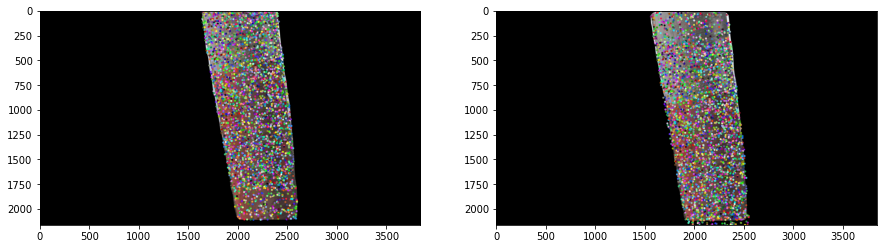

sift key points after essential matrix
matchesMask  397 358
sp1 shape : (358, 1, 2) and sp2 shape : (358, 1, 2)
Projection Matrix
[[ 3.70255042e+03 -1.03886184e+02  2.37474111e+03  5.89939111e+02]
 [ 3.66891719e+01  3.59131044e+03  1.96788274e+03  3.56880227e+03]
 [ 1.49279140e-02 -3.97230449e-02  9.99099213e-01 -2.19727241e-02]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


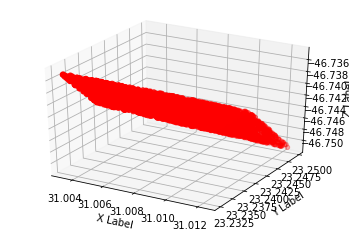

3d image1


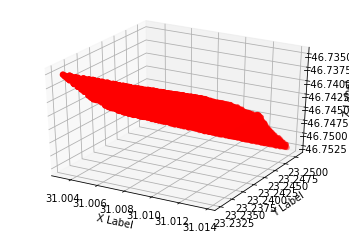


 230
Number of SIFT Keypoints : kp1 : 2871  kp2 : 3655
Number of matches =  1318
Homography 1 between sift keypoints : 
HomographyMask.shape :  (1318, 1)  HomographyMask.sum() :  690

Drawing sift Matches filtered using mask from homography


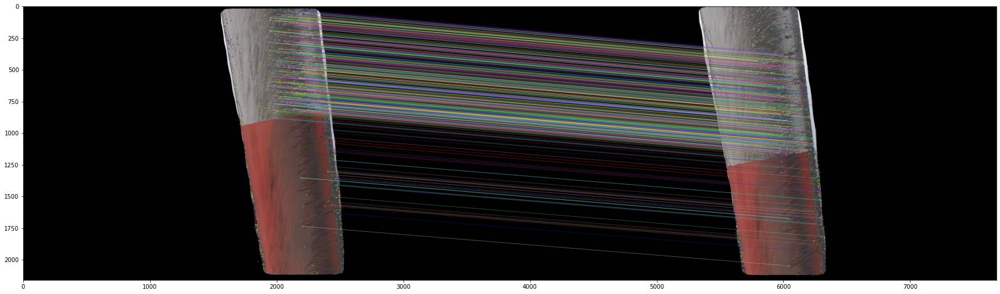

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


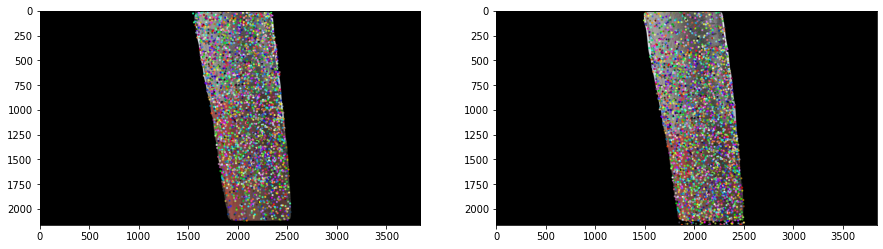

sift key points after essential matrix
matchesMask  690 668
sp1 shape : (668, 1, 2) and sp2 shape : (668, 1, 2)
Projection Matrix
[[3.67108806e+03 2.21661320e+01 2.42521923e+03 3.63017855e+02]
 [9.55698621e+00 3.68776690e+03 1.78092763e+03 3.91916094e+03]
 [1.82275838e-03 1.17089829e-02 9.99929786e-01 1.66689339e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


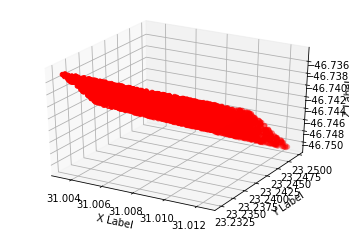

3d image1


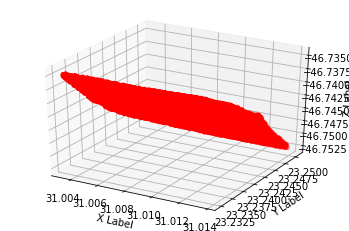


 240
Number of SIFT Keypoints : kp1 : 3655  kp2 : 4519
Number of matches =  1654
Homography 1 between sift keypoints : 
HomographyMask.shape :  (1654, 1)  HomographyMask.sum() :  865

Drawing sift Matches filtered using mask from homography


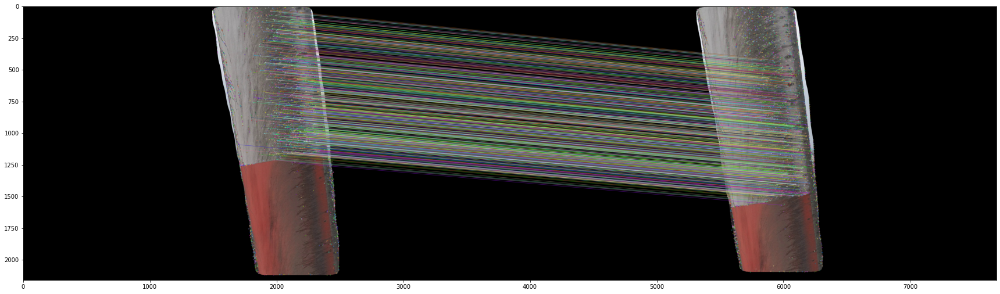

New points : p1 = (4000, 1, 2) p2 = (4000, 1, 2)
Number of points predicted ouside the image 1 =  0
Number of points predicted ouside the image 1 mask =  0
Number of points predicted ouside the image 2 =  0
Number of points predicted ouside the image 2 mask =  0


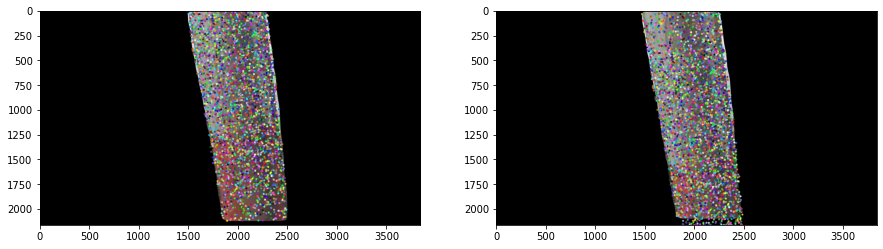

sift key points after essential matrix
matchesMask  865 835
sp1 shape : (835, 1, 2) and sp2 shape : (835, 1, 2)
Projection Matrix
[[3.68841952e+03 1.08689418e+02 2.39641718e+03 1.10774802e+03]
 [2.74514978e+01 3.75308143e+03 1.63861082e+03 4.05850434e+03]
 [9.01253020e-03 4.98920981e-02 9.98713949e-01 3.42297627e-01]]
points used for triangulation
p1 shape : (4000, 2) and p2 shape : (4000, 2)
current 3d image


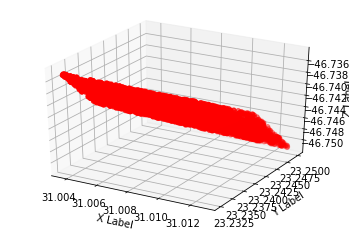

3d image1


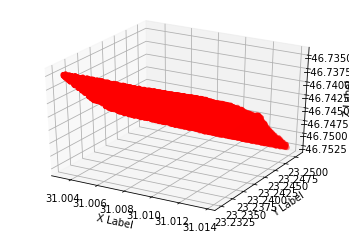

Processing Point Cloud...
Total Points in Point Cloud:  (96000, 3)
Total Colors:  (96000, 3)
Done!


In [ ]:
img1 = cv2.imread(files[0])
img1,_ = get_mask(img1)
# getp1 = get_points(img1)[2]
# kp1, des1 = sift.detectAndCompute(img1, None) 
# img1 = cv2.rotate(img1,cv2.ROTATE_90_CLOCKWISE)

Projection_matrix = None
X = None
Xtot = None
Xtot1 = None
colorstot = None
P_r_all = None
P_l_all = None
p1_final = []
p2_final = []
p1_initial = None
homographies = []
P_r_matrices = []
p1_un_final = []
p2_un_final = []
all_3dpoints1 = []
all_3dpoints2 = []

for i in range(10,len(files),10):
  print('\n',i)
  img2 = cv2.imread(files[i])
  img2,_ = get_mask(img2)
  # img2 = cv2.rotate(img2,cv2.ROTATE_90_CLOCKWISE)

  # getp1 = get_points(img1)[2]
  
  # getp2 = get_points(img2)[2]

  p1,p2,sp1,sp2,all_colors,HM = getNewPoints(img1,img2)  #sp1,sp2 - SIFT Keypoits after homography filtering
  print(f'New points : p1 = {p1.shape} p2 = {p2.shape}')
  # print('Homography shape : ',HM.shape)
  
  homographies.append(HM)

  # p1,p2 = filterPoints(img1,p1,img2,p2)
  # print(f'Filtered new points : p1 = {p1.shape} p2 = {p2.shape}')

  imd = drawPoints(img1,p1,img2,p2)

  E, Emask = cv2.findEssentialMat(sp1, sp2,method=cv2.RANSAC, prob=0.9999, threshold=1.0)
    
  matchesMask = Emask.ravel().tolist()

  sp1 = sp1.reshape(-1,1,2)
  sp2 = sp2.reshape(-1,1,2)

  sp1 = sp1[np.asarray(matchesMask)==1,:,:]
  sp2 = sp2[np.asarray(matchesMask)==1,:,:]

  print('sift key points after essential matrix')
  print('matchesMask ',len(matchesMask),sum(matchesMask))
  print(f'sp1 shape : {sp1.shape} and sp2 shape : {sp2.shape}')

  ret,E2, R, t, mask = cv2.recoverPose(points1 = sp1, points2 = sp2,cameraMatrix1 = K,
                                       distCoeffs1=None,cameraMatrix2=K, distCoeffs2=None)

  # print('Rotation matrix ')
  # print(R)
  # print('translation matrix')
  # print(t)

  #calculate projection matrices  
  M_l = np.hstack((np.eye(3, 3), np.zeros((3, 1))))
  P_l = np.dot(K,  M_l)

  M_r = np.hstack((R, t))
  P_r = np.dot(K,  M_r)

  print('Projection Matrix')
  print(P_r)
  P_r_matrices.append(P_r)
  
  pts_l_norm = cv2.undistortPoints(p1, cameraMatrix=K, distCoeffs=None)
  pts_r_norm = cv2.undistortPoints(p2, cameraMatrix=K, distCoeffs=None)
  p1_un = pts_l_norm.reshape(-1,2)
  p2_un = pts_r_norm.reshape(-1,2)
  print('points used for triangulation')
  print(f'p1 shape : {p1_un.shape} and p2 shape : {p2_un.shape}')

  #triangulate points this requires points in normalized coordinate
  point_4d_hom = cv2.triangulatePoints(P_l, P_r, p1_un.T, p2_un.T)
  point_3d = cv2.convertPointsFromHomogeneous(point_4d_hom.T)[:, 0, :]
  # point_3d = point_3d[:3, :].T
  point_3d_current = point_3d
  all_3dpoints1.append(point_3d_current)

  if X is None:
    X = point_3d_current
    kp = p1_un
    ret, rvecs, t, inliers = cv2.solvePnPRansac(X, kp, K, d, cv2.SOLVEPNP_ITERATIVE)
    R, _ = cv2.Rodrigues(rvecs)
    # Rt = np.hstack((R, t))
    M_r = np.hstack((R, t))
    P_r_all = np.dot(K,  M_r)
    Projection_matrix = P_r_all
    P_l_all = P_l
  

  # print(P_r_all)
  
  point_4d_hom = cv2.triangulatePoints(P_l, P_r_all, p1_un.T, p2_un.T)
  point_3d = cv2.convertPointsFromHomogeneous(point_4d_hom.T)[:, 0, :]
  point_3d_current = point_3d
  all_3dpoints2.append(point_3d_current)

  print('current 3d image')
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')
  ax.set_xlabel('X Label')
  ax.set_ylabel('Y Label')
  ax.set_zlabel('Z Label')

  x, y, z = point_3d_current.T
  ax.scatter(x, y, z, c="r", marker="o")
  plt.show()

 
  p1_final.append(p1)
  
  p2_final.append(p2)

  p1_un_final.append(p1_un)
  
  p2_un_final.append(p2_un)  

  p1_initial = p1
  # p1 = p1.reshape(-1,2)
  # colors = np.array([img1[l[1], l[0]] for l in np.int0(p1)])
  # colors = np.array([[0,0,255] for l in np.int0(p1)])

  if colorstot is None:
    colorstot = all_colors
  else:
    colorstot = np.vstack((colorstot, all_colors))
  
  if Xtot is None:
    Xtot = point_3d_current
  else:
    Xtot = np.vstack((Xtot,point_3d_current))
  
  print('3d image1')
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')
  ax.set_xlabel('X Label')
  ax.set_ylabel('Y Label')
  ax.set_zlabel('Z Label')

  x, y, z = Xtot.T
  ax.scatter(x, y, z, c="r", marker="o")
  plt.show()



  img1 = img2


print("Processing Point Cloud...")
print("Total Points in Point Cloud: ",Xtot.shape)
print('Total Colors: ',colorstot.shape)
path = '/content/sample_data/'
# if os.path.exists(path) is False:
#   os.mkdir(path) 
to_ply(path, Xtot, colorstot, densify = True)
print("Done!")